<a href="https://colab.research.google.com/github/Kriti1211/AdvJava/blob/main/Dehazing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

Histogram equalization

In [ ]:
def equalize_histogram(image):
    histogram, bins = np.histogram(image.flatten(), 256, [0,256])
    cdf = histogram.cumsum()
    cdf_normalized = cdf * float(histogram.max()) / cdf.max()
    image_equalized = np.interp(image.flatten(), bins[:-1], cdf_normalized)
    image_equalized = (image_equalized * 255 / np.max(image_equalized)).astype('uint8')
    return image_equalized.reshape(image.shape)

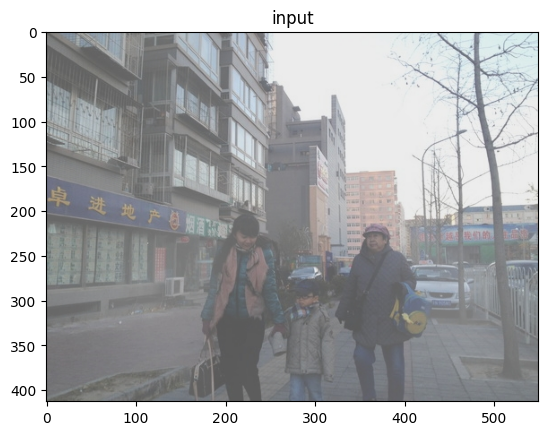

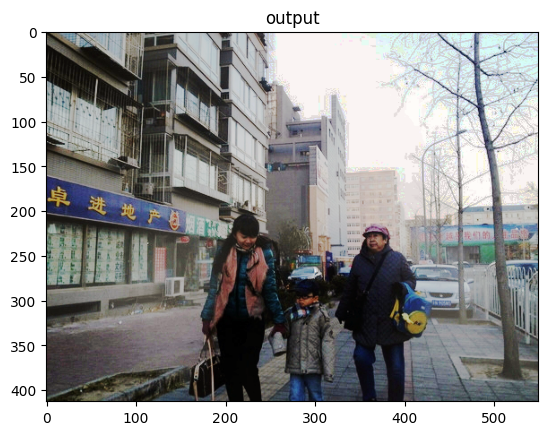

In [ ]:
# Load image
img = cv2.imread('/content/haze1.jpeg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.title('input')
plt.show()

# divide into R, G, B channels
b, g, r = cv2.split(img)

# Perform dehazing
b = equalize_histogram(b)
g = equalize_histogram(g)
r = equalize_histogram(r)
# dehazed_img = equalize_histogram(img)

# merge the channels
dehazed_img = cv2.merge([b, g, r])

# Save the dehazed image
plt.imshow(dehazed_img)
plt.title('output')
plt.show()

Contrast Limited Adaptive Histogram Equalization (CLAHE): This is an improved version of histogram equalization that performs the operation separately for small regions in the image. This can lead to better results because it can adapt to local changes in contrast.

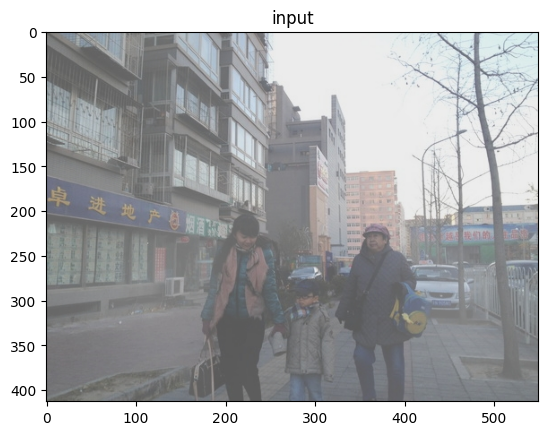

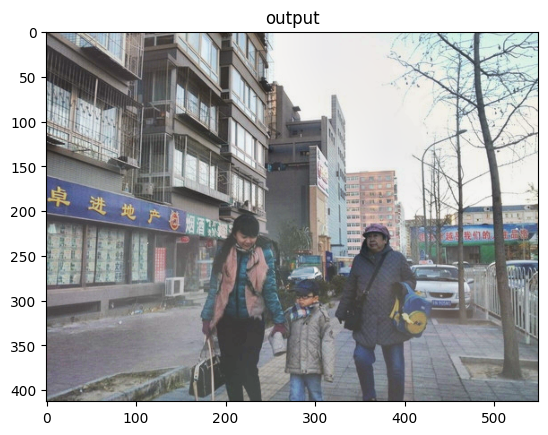

In [ ]:
# Load image
img = cv2.imread('/content/haze1.jpeg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.title('input')
plt.show()

# divide into R, G, B channels
b, g, r = cv2.split(img)

# Create a CLAHE object
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))

# Apply CLAHE to each channel
r_clahe = clahe.apply(r)
g_clahe = clahe.apply(g)
b_clahe = clahe.apply(b)

# Merge R,G,B channels
dehazed_img = cv2.merge([b_clahe, g_clahe, r_clahe])

# Save the dehazed image
plt.imshow(dehazed_img)
plt.title('output')
plt.show()

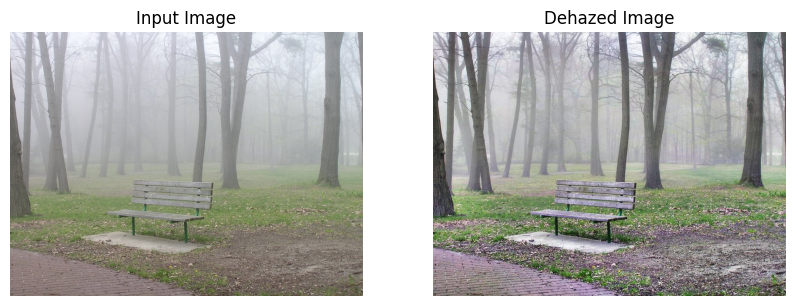

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Load and convert the image
img = cv2.imread('/content/foggy_bench.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display the input image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Input Image')
plt.axis('off')

# Split the image into R, G, B channels
r, g, b = cv2.split(img_rgb)

# Create a CLAHE object with the specified clip limit and tile grid size
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Apply CLAHE to each channel
r_clahe = clahe.apply(r)
g_clahe = clahe.apply(g)
b_clahe = clahe.apply(b)

# Merge the CLAHE-enhanced channels back into a single image
dehazed_img = cv2.merge([r_clahe, g_clahe, b_clahe])

# Display the dehazed image
plt.subplot(1, 2, 2)
plt.imshow(dehazed_img)
plt.title('Dehazed Image')
plt.axis('off')

plt.show()


**Gamma Correction**

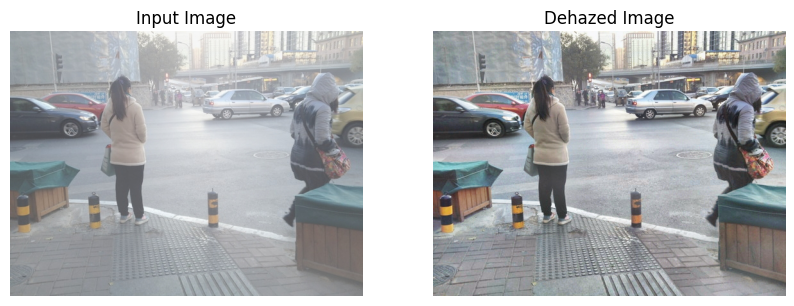

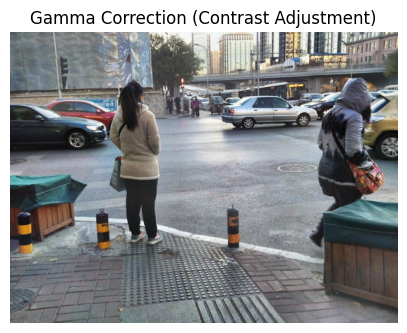

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load and convert the image
img = cv2.imread('/content/haze3.jpeg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display the input image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Input Image')
plt.axis('off')

# Split the image into R, G, B channels
r, g, b = cv2.split(img_rgb)

# Create a CLAHE object with the specified clip limit and tile grid size
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Apply CLAHE to each channel
r_clahe = clahe.apply(r)
g_clahe = clahe.apply(g)
b_clahe = clahe.apply(b)

# Merge the CLAHE-enhanced channels back into a single image
dehazed_img = cv2.merge([r_clahe, g_clahe, b_clahe])

# Display the dehazed image
plt.subplot(1, 2, 2)
plt.imshow(dehazed_img)
plt.title('Dehazed Image')
plt.axis('off')

# Apply gamma correction to adjust contrast
gamma = 1.5  # You can adjust the gamma value as needed
gamma_corrected = np.uint8(np.clip((dehazed_img / 255.0) ** gamma * 255.0, 0, 255))

# Display the gamma-corrected image
plt.figure(figsize=(5, 5))
plt.imshow(gamma_corrected)
plt.title('Gamma Correction (Contrast Adjustment)')
plt.axis('off')
plt.show()

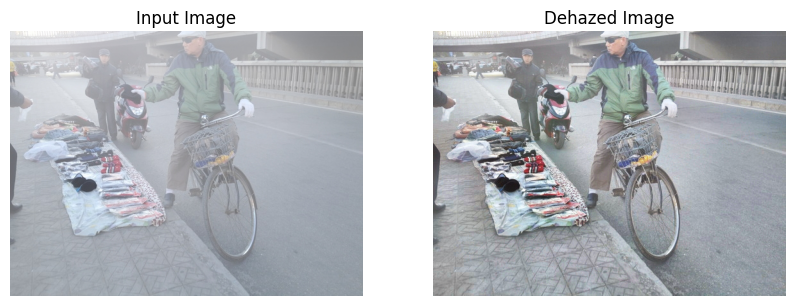

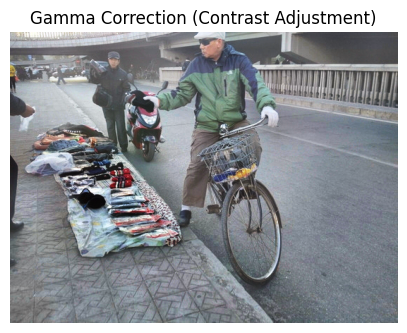

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load and convert the image
img = cv2.imread('/content/haze4.jpeg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display the input image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Input Image')
plt.axis('off')

# Split the image into R, G, B channels
r, g, b = cv2.split(img_rgb)

# Create a CLAHE object with the specified clip limit and tile grid size
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Apply CLAHE to each channel
r_clahe = clahe.apply(r)
g_clahe = clahe.apply(g)
b_clahe = clahe.apply(b)

# Merge the CLAHE-enhanced channels back into a single image
dehazed_img = cv2.merge([r_clahe, g_clahe, b_clahe])

# Display the dehazed image
plt.subplot(1, 2, 2)
plt.imshow(dehazed_img)
plt.title('Dehazed Image')
plt.axis('off')

# Apply gamma correction to adjust contrast
gamma = 1.5  # You can adjust the gamma value as needed
gamma_corrected = np.uint8(np.clip((dehazed_img / 255.0) ** gamma * 255.0, 0, 255))

# Display the gamma-corrected image
plt.figure(figsize=(5, 5))
plt.imshow(gamma_corrected)
plt.title('Gamma Correction (Contrast Adjustment)')
plt.axis('off')
plt.show()

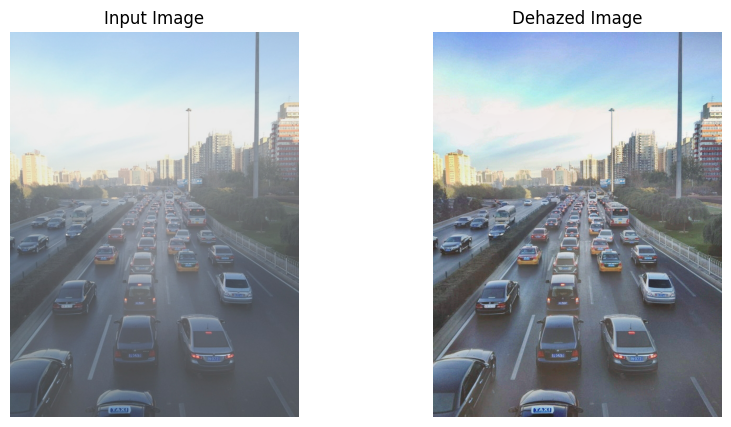

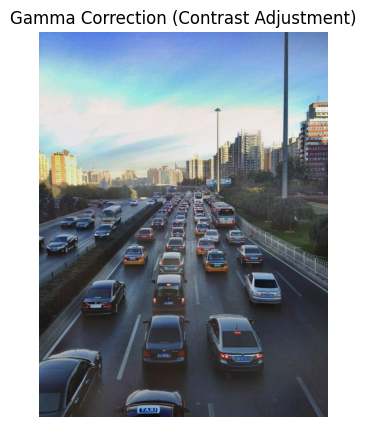

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load and convert the image
img = cv2.imread('/content/haze5.jpeg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display the input image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Input Image')
plt.axis('off')

# Split the image into R, G, B channels
r, g, b = cv2.split(img_rgb)

# Create a CLAHE object with the specified clip limit and tile grid size
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Apply CLAHE to each channel
r_clahe = clahe.apply(r)
g_clahe = clahe.apply(g)
b_clahe = clahe.apply(b)

# Merge the CLAHE-enhanced channels back into a single image
dehazed_img = cv2.merge([r_clahe, g_clahe, b_clahe])

# Display the dehazed image
plt.subplot(1, 2, 2)
plt.imshow(dehazed_img)
plt.title('Dehazed Image')
plt.axis('off')

# Apply gamma correction to adjust contrast
gamma = 1.5  # You can adjust the gamma value as needed
gamma_corrected = np.uint8(np.clip((dehazed_img / 255.0) ** gamma * 255.0, 0, 255))

# Display the gamma-corrected image
plt.figure(figsize=(5, 5))
plt.imshow(gamma_corrected)
plt.title('Gamma Correction (Contrast Adjustment)')
plt.axis('off')
plt.show()

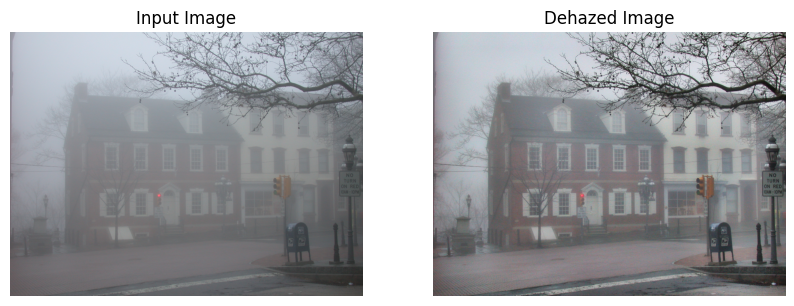

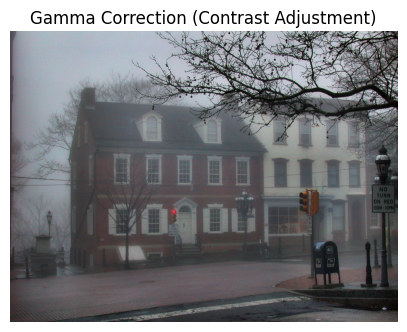

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load and convert the image
img = cv2.imread('/content/foggyHouse.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display the input image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Input Image')
plt.axis('off')

# Split the image into R, G, B channels
r, g, b = cv2.split(img_rgb)

# Create a CLAHE object with the specified clip limit and tile grid size
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Apply CLAHE to each channel
r_clahe = clahe.apply(r)
g_clahe = clahe.apply(g)
b_clahe = clahe.apply(b)

# Merge the CLAHE-enhanced channels back into a single image
dehazed_img = cv2.merge([r_clahe, g_clahe, b_clahe])

# Display the dehazed image
plt.subplot(1, 2, 2)
plt.imshow(dehazed_img)
plt.title('Dehazed Image')
plt.axis('off')

# Apply gamma correction to adjust contrast
gamma = 1.5  # You can adjust the gamma value as needed
gamma_corrected = np.uint8(np.clip((dehazed_img / 255.0) ** gamma * 255.0, 0, 255))

# Display the gamma-corrected image
plt.figure(figsize=(5, 5))
plt.imshow(gamma_corrected)
plt.title('Gamma Correction (Contrast Adjustment)')
plt.axis('off')
plt.show()

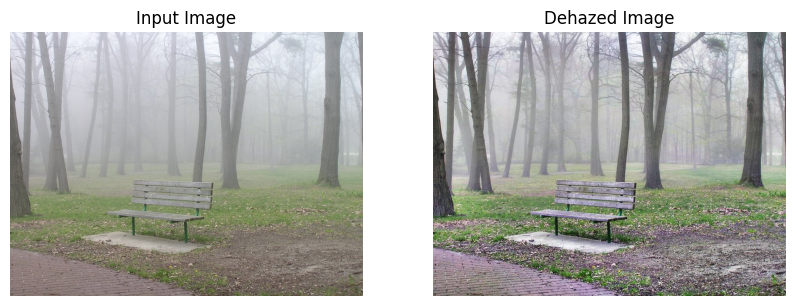

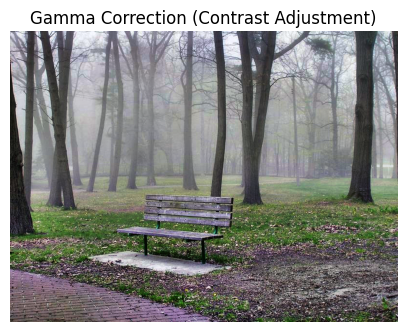

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load and convert the image
img = cv2.imread('/content/foggy_bench.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display the input image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Input Image')
plt.axis('off')

# Split the image into R, G, B channels
r, g, b = cv2.split(img_rgb)

# Create a CLAHE object with the specified clip limit and tile grid size
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Apply CLAHE to each channel
r_clahe = clahe.apply(r)
g_clahe = clahe.apply(g)
b_clahe = clahe.apply(b)

# Merge the CLAHE-enhanced channels back into a single image
dehazed_img = cv2.merge([r_clahe, g_clahe, b_clahe])

# Display the dehazed image
plt.subplot(1, 2, 2)
plt.imshow(dehazed_img)
plt.title('Dehazed Image')
plt.axis('off')

# Apply gamma correction to adjust contrast
gamma = 1.5  # You can adjust the gamma value as needed
gamma_corrected = np.uint8(np.clip((dehazed_img / 255.0) ** gamma * 255.0, 0, 255))

# Display the gamma-corrected image
plt.figure(figsize=(5, 5))
plt.imshow(gamma_corrected)
plt.title('Gamma Correction (Contrast Adjustment)')
plt.axis('off')
plt.show()

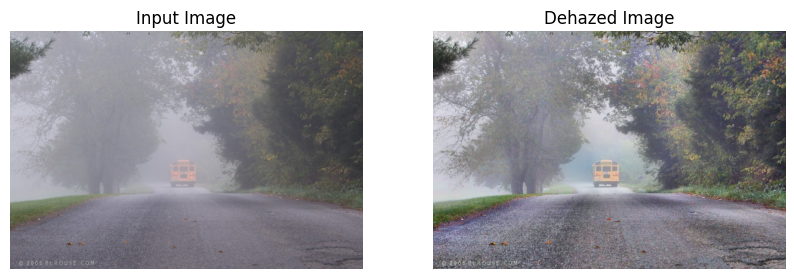

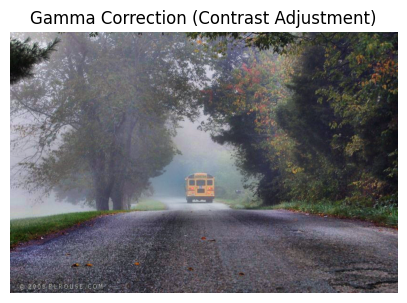

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Load and convert the image
img = cv2.imread('/content/foggy-school-morning.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display the input image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Input Image')
plt.axis('off')

# Split the image into R, G, B channels
r, g, b = cv2.split(img_rgb)

# Create a CLAHE object with the specified clip limit and tile grid size
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Apply CLAHE to each channel
r_clahe = clahe.apply(r)
g_clahe = clahe.apply(g)
b_clahe = clahe.apply(b)

# Merge the CLAHE-enhanced channels back into a single image
dehazed_img = cv2.merge([r_clahe, g_clahe, b_clahe])

# Display the dehazed image
plt.subplot(1, 2, 2)
plt.imshow(dehazed_img)
plt.title('Dehazed Image')
plt.axis('off')

# Apply gamma correction to adjust contrast
gamma = 1.5  # You can adjust the gamma value as needed
gamma_corrected = np.uint8(np.clip((dehazed_img / 255.0) ** gamma * 255.0, 0, 255))

# Display the gamma-corrected image
plt.figure(figsize=(5, 5))
plt.imshow(gamma_corrected)
plt.title('Gamma Correction (Contrast Adjustment)')
plt.axis('off')
plt.show()


**Unsharp Masking**

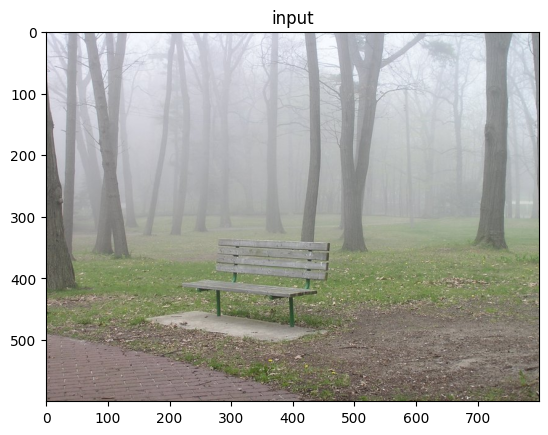

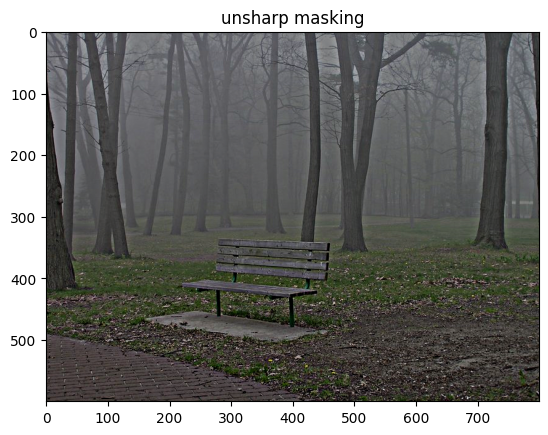

In [ ]:
img = cv2.imread('/content/foggy_bench.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.title('input')
plt.show()

# Apply unsharp masking
blurred = cv2.GaussianBlur(img, (0, 0), 7)
sharpened = cv2.addWeighted(img, 1.5, blurred, -1.0, 0)

# Save the sharpened image
plt.imshow(sharpened)
plt.title('unsharp masking')
plt.show()

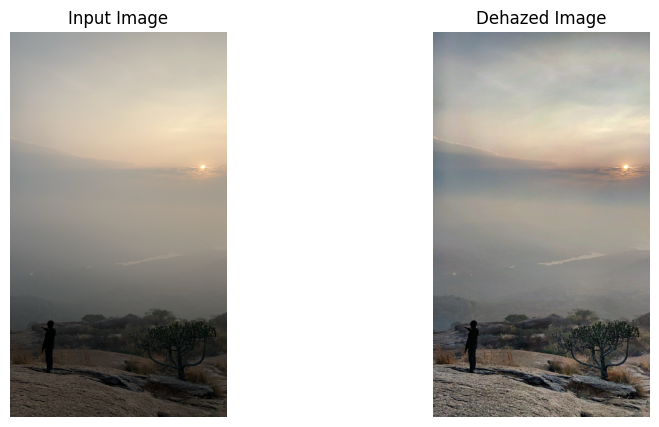

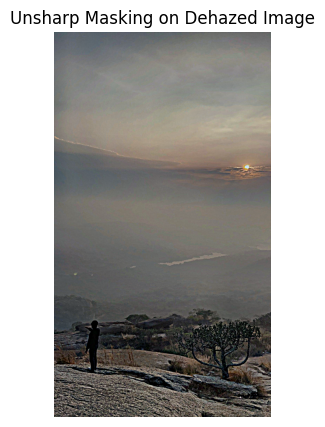

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Load and convert the image
img = cv2.imread('/content/haze6.jpeg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display the input image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Input Image')
plt.axis('off')

# Split the image into R, G, B channels
r, g, b = cv2.split(img_rgb)

# Create a CLAHE object with the specified clip limit and tile grid size
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Apply CLAHE to each channel
r_clahe = clahe.apply(r)
g_clahe = clahe.apply(g)
b_clahe = clahe.apply(b)

# Merge the CLAHE-enhanced channels back into a single image
dehazed_img = cv2.merge([r_clahe, g_clahe, b_clahe])

# Display the dehazed image
plt.subplot(1, 2, 2)
plt.imshow(dehazed_img)
plt.title('Dehazed Image')
plt.axis('off')

# Apply unsharp masking to the dehazed image
blurred = cv2.GaussianBlur(dehazed_img, (0, 0), 10)
sharpened = cv2.addWeighted(dehazed_img, 1.75, blurred, -1.0, 0)

# Display the sharpened image
plt.figure(figsize=(5, 5))
plt.imshow(sharpened)
plt.title('Unsharp Masking on Dehazed Image')
plt.axis('off')
plt.show()


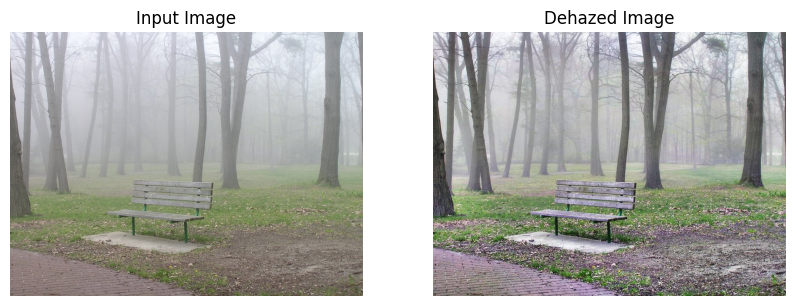

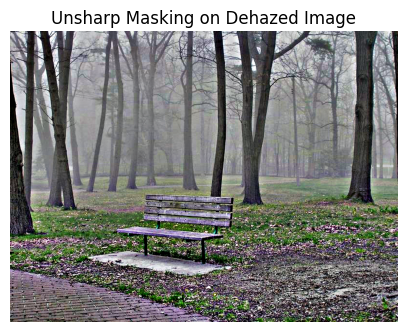

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Load and convert the image
img = cv2.imread('/content/foggy_bench.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display the input image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Input Image')
plt.axis('off')

# Split the image into R, G, B channels
r, g, b = cv2.split(img_rgb)

# Create a CLAHE object with the specified clip limit and tile grid size
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Apply CLAHE to each channel
r_clahe = clahe.apply(r)
g_clahe = clahe.apply(g)
b_clahe = clahe.apply(b)

# Merge the CLAHE-enhanced channels back into a single image
dehazed_img = cv2.merge([r_clahe, g_clahe, b_clahe])

# Display the dehazed image
plt.subplot(1, 2, 2)
plt.imshow(dehazed_img)
plt.title('Dehazed Image')
plt.axis('off')

# Apply unsharp masking to the dehazed image
blurred = cv2.GaussianBlur(dehazed_img, (0, 0), 10)
sharpened = cv2.addWeighted(dehazed_img, 1.75, blurred, -1.0, 0)

# Display the sharpened image
plt.figure(figsize=(5, 5))
plt.imshow(sharpened)
plt.title('Unsharp Masking on Dehazed Image')
plt.axis('off')
plt.show()

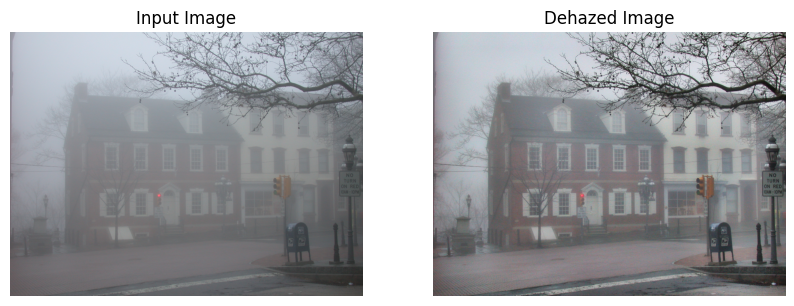

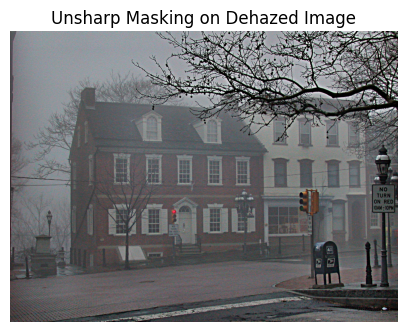

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Load and convert the image
img = cv2.imread('/content/foggyHouse.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display the input image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Input Image')
plt.axis('off')

# Split the image into R, G, B channels
r, g, b = cv2.split(img_rgb)

# Create a CLAHE object with the specified clip limit and tile grid size
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Apply CLAHE to each channel
r_clahe = clahe.apply(r)
g_clahe = clahe.apply(g)
b_clahe = clahe.apply(b)

# Merge the CLAHE-enhanced channels back into a single image
dehazed_img = cv2.merge([r_clahe, g_clahe, b_clahe])

# Display the dehazed image
plt.subplot(1, 2, 2)
plt.imshow(dehazed_img)
plt.title('Dehazed Image')
plt.axis('off')

# Apply unsharp masking to the dehazed image
blurred = cv2.GaussianBlur(dehazed_img, (0, 0), 10)
sharpened = cv2.addWeighted(dehazed_img, 1.75, blurred, -1.0, 0)

# Display the sharpened image
plt.figure(figsize=(5, 5))
plt.imshow(sharpened)
plt.title('Unsharp Masking on Dehazed Image')
plt.axis('off')
plt.show()

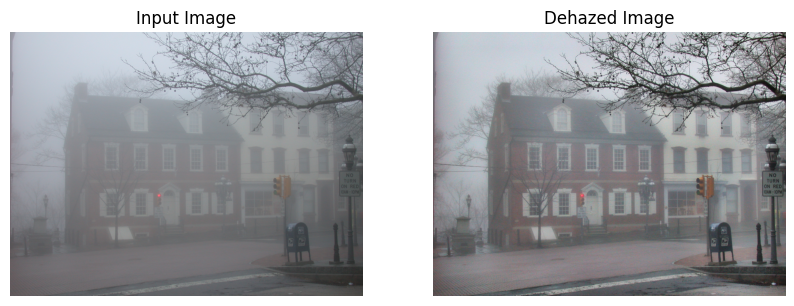

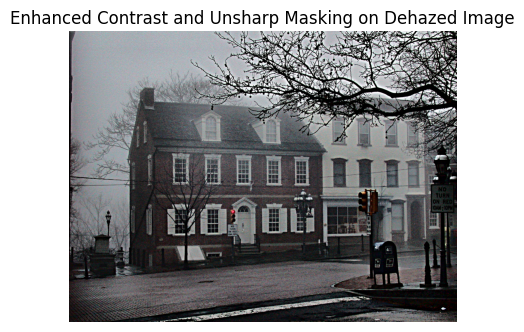

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Load and convert the image
img = cv2.imread('/content/foggyHouse.jpg')
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Display the input image
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img_rgb)
plt.title('Input Image')
plt.axis('off')

# Split the image into R, G, B channels
r, g, b = cv2.split(img_rgb)

# Create a CLAHE object with the specified clip limit and tile grid size
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Apply CLAHE to each channel
r_clahe = clahe.apply(r)
g_clahe = clahe.apply(g)
b_clahe = clahe.apply(b)

# Merge the CLAHE-enhanced channels back into a single image
dehazed_img = cv2.merge([r_clahe, g_clahe, b_clahe])

# Display the dehazed image
plt.subplot(1, 2, 2)
plt.imshow(dehazed_img)
plt.title('Dehazed Image')
plt.axis('off')

# Apply histogram equalization to increase contrast
dehazed_img_equalized = cv2.cvtColor(dehazed_img, cv2.COLOR_RGB2LAB)
dehazed_img_equalized[:, :, 0] = cv2.equalizeHist(dehazed_img_equalized[:, :, 0])
dehazed_img_equalized = cv2.cvtColor(dehazed_img_equalized, cv2.COLOR_LAB2RGB)

# Apply unsharp masking to the dehazed image with increased contrast
blurred = cv2.GaussianBlur(dehazed_img_equalized, (0, 0), 10)
sharpened = cv2.addWeighted(dehazed_img_equalized, 1.75, blurred, -1.0, 0)

# Display the sharpened image
plt.figure(figsize=(5, 5))
plt.imshow(sharpened)
plt.title('Enhanced Contrast and Unsharp Masking on Dehazed Image')
plt.axis('off')
plt.show()
